# Pokemon with stats

###### 목적: 일반 포켓몬과 전설 포켓몬 분류하기

# Load Library

In [1]:
import numpy as np
import pandas as pd
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Load Data

In [2]:
data = pd.read_csv('/home/theo/aiffel/pokemon_eda/data/Pokemon.csv')
df = data.copy()
print(df.shape)
df.head()

(800, 13)


,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False


In [4]:
profile = df.profile_report()
profile

# Data Profile

###### 요약 

1. 총 800 row, 13 columns
2. Type 2 Columns 에 null 값이 있다. 386/800

###### Columns 설명
* #: ID for each pokemon
  * 각 포켓몬의 고유한 ID 값이다.
  * 1번부터 721번까지 있다.
  * 479번, 386번, 710, 711번처럼 중복되는 값이 있다.


* Name: Name of each pokemon
  * 각 포켓몬의 고유한 이름이다.
  * 800개의 고유한 이름이 있다.
  * 같은 ID 값을 가지지만, 이름은 서로 다른 포켓몬이 있다.


* Type 1: Each pokemon has a type, this determines weakness/resistance to attacks
  * 각 포켓몬이 가진 속성값이다.
  * 속성별 상성이 존재한다.
  * 총 18개의 상성이 있다.
  * Water, Normal, Grass ... 의 순서로 Water 속성을 가진 포켓몬이 제일 많다.


* Type 2: Some pokemon are dual type and have 2
  * 몇몇 포켓몬은 두 가지 속성을 가진다. 414/800 (52.8%)
  * Flying, Ground, Poison ...의 순서로 Flying 속성을 가진 포켓몬이 제일 많다.


* Total: sum of all stats that come after this, a general guide to how strong a pokemon is
  * 포켓몬의 모든 능력치의 합이다.
  * 최솟값 ~ 최댓값 (180 ~ 780)
  * 600, 405, 500, 580 등 특정 값에 중복이 많다


* HP: hit points, or health, defines how much damage a pokemon can withstand before fainting
  * 체력 능력치
  * 최솟값 ~ 최댓값 (1 ~ 255)
  * 50~80 사이에 많이 분포


* Attack: the base modifier for normal attacks (eg. Scratch, Punch)
  * 일반 공격력 능력치 (할퀴기, 때리기 등)
  * 최솟값 ~ 최댓값 (5 ~ 190)
  

* Defense: the base damage resistance against normal attacks
  * 일반 방어력 능력치 (일반 공격에 대한 방어)
  * 최솟값 ~ 최댓값 (5 ~ 230)
  * 해당 능력치가 특출한 포켓몬이 있다.
  

* SP Atk: special attack, the base modifier for special attacks (e.g. fire blast, bubble beam)
  * 특수 공격력 능력치 (불대문자, 거품광선 등)
  * 최솟값 ~ 최댓값 (10 ~ 194)


* SP Def: the base damage resistance against special attacks
  * 특수 방어력 능력치 (특수 공격에 대한 방어)
  * 최솟값 ~ 최댓값 (20 ~ 230)
  * 해당 능력치가 특출한 포켓몬이 있다.
  

* Speed: determines which pokemon attacks first each round 
  * 속도 능력치 각 라운드마다 각 포켓몬의 선제 공격권을 결정한다.
  * 최솟값 ~ 최댓값 (5 ~ 180)
  
  
* Generation
  * 포켓몬 세대
  * 총 6세대까지 있다.
  * 세대별 포켓몬 수가 다르다.
  
  
* Legendary
  * 전설 포켓몬 여부 (65/800 8.1%)

## 일반 포켓몬과 전설 포켓몬을 분류해보기

#### 전설 포켓몬: 포켓몬스터 시리즈에 등장하는 포켓몬 중에서도 일종의 신이나 영물 취급을 받는 포켓몬의 통칭이다.
* 일반 포켓몬 보다 희귀하고, 특징이 있을 것 같다.
* 전설 포켓몬의 특징을 찾는 것부터 시작해보자!

#### 궁금한 사항

1. 일반 포켓몬보다 전설 포켓몬이 더 강할까?
2. 일반 포켓몬과 전설 포켓몬의 가장 큰 차이는 무엇일까?
3. 각 세대별로 전설 포켓몬의 특징이 있을까?

### 궁금한 사항 1. 일반 포켓몬보다 전설 포켓몬이 더 강할까?

In [7]:
# Total Columns를 통해 포켓몬의 일반적인 강함 정도를 알 수 있다.
# 일반 포켓몬과 전설 포켓몬의 Total 값을 알아보자

<AxesSubplot:xlabel='Type 1', ylabel='Total'>

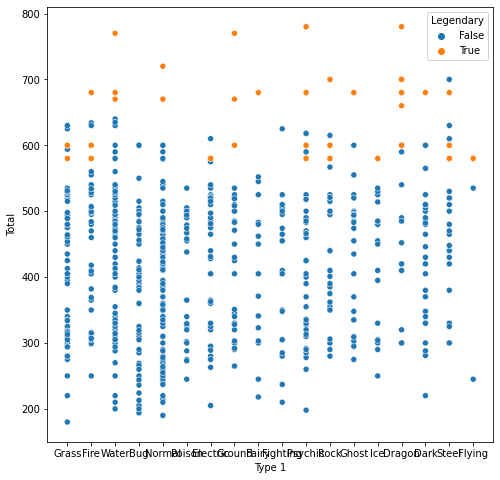

In [11]:
plt.figure(figsize= [8, 8])
sns.scatterplot(data = df, x = 'Type 1', y = 'Total', hue = 'Legendary' )

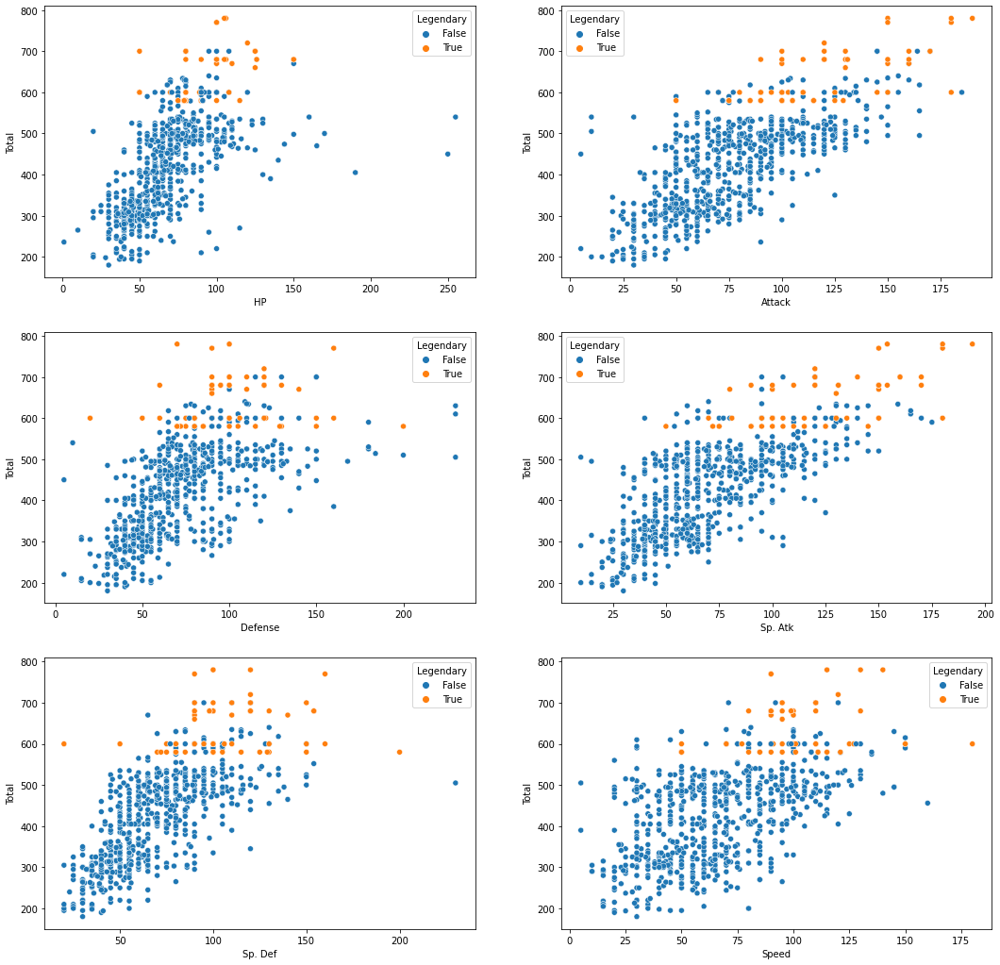

In [12]:
figure, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(nrows=3, ncols=2)
figure.set_size_inches(18, 18)

sns.scatterplot(data=df, y="Total", x="HP", hue="Legendary", ax=ax1)
sns.scatterplot(data=df, y="Total", x="Attack", hue="Legendary", ax=ax2)
sns.scatterplot(data=df, y="Total", x="Defense", hue="Legendary", ax=ax3)
sns.scatterplot(data=df, y="Total", x="Sp. Atk", hue="Legendary", ax=ax4)
sns.scatterplot(data=df, y="Total", x="Sp. Def", hue="Legendary", ax=ax5)
sns.scatterplot(data=df, y="Total", x="Speed", hue="Legendary", ax=ax6)
plt.show()